In [2]:
#importing required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.rcParams["figure.dpi"]=350
plt.rcParams["figure.figsize"]=(10,10)
import warnings
warnings.filterwarnings("ignore")

In [3]:
#importing data to dataframe using pandas
df=pd.read_csv("Bankruptcy Prediction.csv")

In [4]:
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [5]:
df.tail()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009
6818,0,0.493053,0.570105,0.549548,0.627409,0.627409,0.998080,0.801987,0.813800,0.313415,...,0.815956,0.000707,0.626680,0.627408,0.841019,0.275114,0.026793,0.565167,1,0.233902


In [6]:
#getting information about features like non-null value count , datatype etc.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [7]:
#dimension of dataframe
df.shape

(6819, 96)

In [8]:
df[' Net Income Flag'].value_counts()

 Net Income Flag
1    6819
Name: count, dtype: int64

In [9]:
#we can drop the column because we have constant value of the column for each record
df.drop(columns=[" Net Income Flag"],inplace=True)

In [10]:
df.shape

(6819, 95)

In [11]:
#checking duplicate records
df.duplicated().sum()

0

In [12]:
#checking null values
df.isna().sum()

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
                                                           ..
 Net Income to Stockholder's Equity                         0
 Liability to Equity                                        0
 Degree of Financial Leverage (DFL)                         0
 Interest Coverage Ratio (Interest expense to EBIT)         0
 Equity to Liability                                        0
Length: 95, dtype: int64

In [13]:
#we don't have any null values in the dataset and all features of int and float datatype
#Due to no categorial data , we don't need any encoding like one-hot-encoding or label encoding

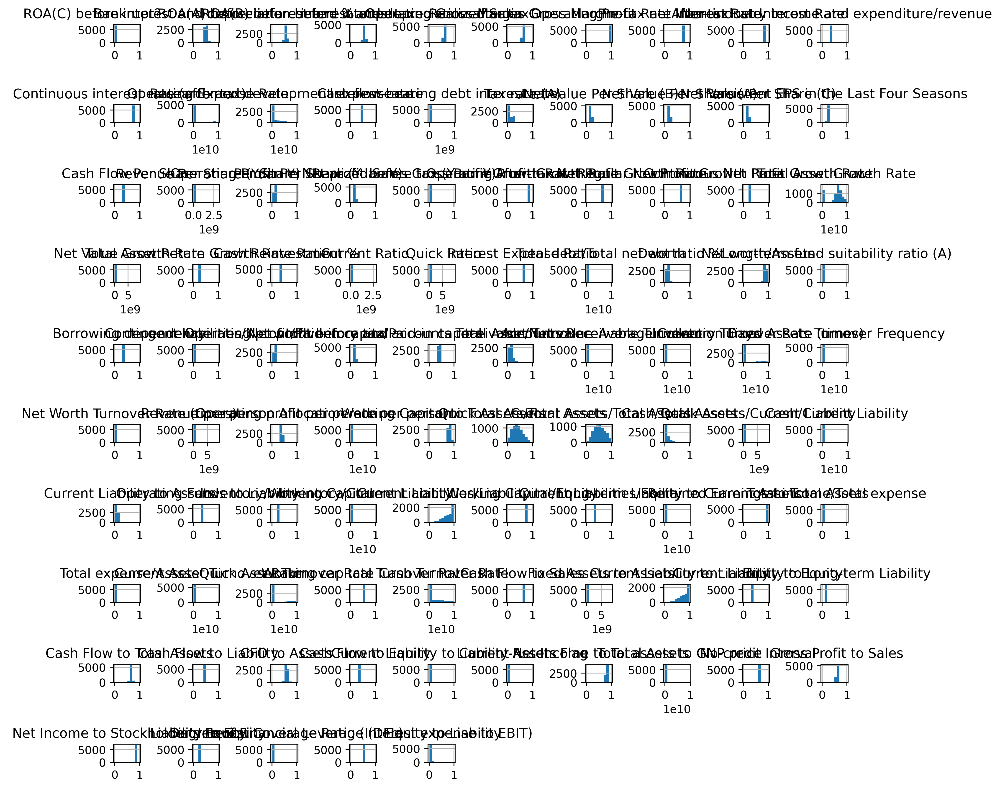

In [14]:
#let's visualize the data
df.hist()
plt.tight_layout()

In [15]:
df.corr()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
Bankrupt?,1.000000,-0.260807,-0.282941,-0.273051,-0.100043,-0.099445,-0.000230,-0.008517,-0.008857,-0.016593,...,0.139212,-0.315457,0.035104,-0.005547,-0.100044,-0.180987,0.166812,0.010508,-0.005509,-0.083048
ROA(C) before interest and depreciation before interest,-0.260807,1.000000,0.940124,0.986849,0.334719,0.332755,0.035725,0.053419,0.049222,0.020501,...,-0.109272,0.887670,-0.071725,0.008135,0.334721,0.274287,-0.143629,-0.016575,0.010573,0.052416
ROA(A) before interest and % after tax,-0.282941,0.940124,1.000000,0.955741,0.326969,0.324956,0.032053,0.053518,0.049474,0.029649,...,-0.156890,0.961552,-0.098900,0.011463,0.326971,0.291744,-0.141039,-0.011515,0.013372,0.057887
ROA(B) before interest and depreciation after tax,-0.273051,0.986849,0.955741,1.000000,0.333749,0.331755,0.035212,0.053726,0.049952,0.022366,...,-0.120680,0.912040,-0.089088,0.007523,0.333750,0.280617,-0.142838,-0.014663,0.011473,0.056430
Operating Gross Margin,-0.100043,0.334719,0.326969,0.333749,1.000000,0.999518,0.005745,0.032493,0.027175,0.051438,...,-0.032930,0.300143,0.022672,0.004205,1.000000,0.075304,-0.085434,-0.011806,-0.001167,0.120029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Net Income to Stockholder's Equity,-0.180987,0.274287,0.291744,0.280617,0.075304,0.074891,0.006216,0.011343,0.010648,0.007693,...,0.192688,0.328492,-0.040217,0.000127,0.075303,1.000000,-0.791836,-0.000093,0.005147,0.029622
Liability to Equity,0.166812,-0.143629,-0.141039,-0.142838,-0.085434,-0.085407,0.001541,-0.004043,-0.004390,-0.011899,...,-0.229559,-0.159697,0.021982,-0.003724,-0.085434,-0.791836,1.000000,0.002119,0.001487,-0.159654
Degree of Financial Leverage (DFL),0.010508,-0.016575,-0.011515,-0.014663,-0.011806,-0.011268,0.000935,0.000855,0.000927,-0.000556,...,-0.001717,-0.010463,-0.001881,-0.008812,-0.011806,-0.000093,0.002119,1.000000,0.016513,-0.016739
Interest Coverage Ratio (Interest expense to EBIT),-0.005509,0.010573,0.013372,0.011473,-0.001167,-0.001158,0.000393,0.000984,0.000957,0.001024,...,-0.000974,0.012746,0.000239,0.001027,-0.001169,0.005147,0.001487,0.016513,1.000000,-0.008339


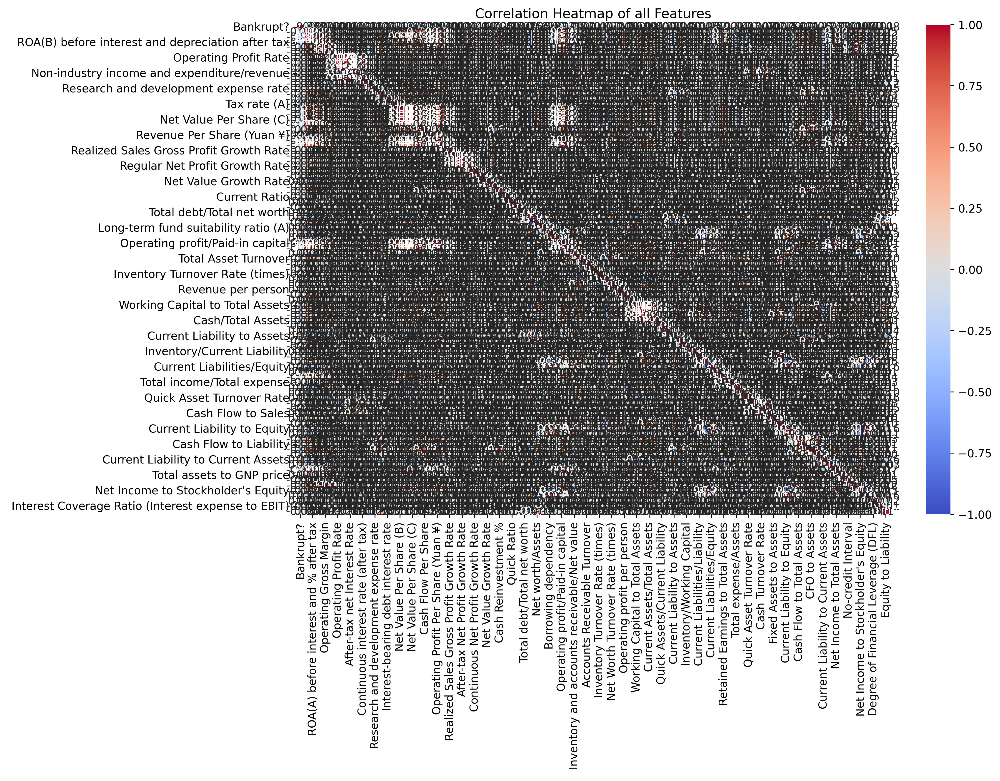

In [16]:
# Plot the heatmap
#Values close to 1 or -1 indicate high correlation between features, indicates possible multicollinearity.
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap of all Features")
plt.show()

In [17]:
#Target column is Bankrupt?
#Let's check the classes in target column
df['Bankrupt?'].value_counts()

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

In [18]:
#we found that, there are 2 classes like bankrupt as 1 and non-bankrupt as 0
#let's check the percentage
df['Bankrupt?'].value_counts(normalize=True)*100

Bankrupt?
0    96.77372
1     3.22628
Name: proportion, dtype: float64

In [19]:
#As we are able to see that there is biased data in target column
#Due to this , data is imbalanced. We need to balance data primarily by using oversampling like SMOTE
#We need to resample to balance the data

In [20]:
#One of the most common methods for oversampling is SMOTE (Synthetic Minority Over-sampling Technique)
#it will generate sample with nearest neighbor of minorty class samples
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Split the dataset into features (X) and target (y)
X1 = df.drop(columns=['Bankrupt?'])
y1 = df['Bankrupt?']

# Split into training and testing sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.3, random_state=42, stratify=y1)

# Apply SMOTE to the training data to oversample the minority class
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train1, y_train1)

# Check the distribution of classes after SMOTE
print("Class distribution before SMOTE:", y_train1.value_counts())
print("Class distribution after SMOTE:", pd.Series(y_train_resampled).value_counts())

# Train a model using the resampled training data
model = RandomForestClassifier(random_state=42)
model.fit(X_train_resampled, y_train_resampled)

# Make predictions and evaluate the model
y_pred = model.predict(X_test1)

# Print the classification report to evaluate the model performance
print(classification_report(y_test1, y_pred))

Class distribution before SMOTE: Bankrupt?
0    4619
1     154
Name: count, dtype: int64
Class distribution after SMOTE: Bankrupt?
0    4619
1    4619
Name: count, dtype: int64
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1980
           1       0.39      0.50      0.44        66

    accuracy                           0.96      2046
   macro avg       0.69      0.74      0.71      2046
weighted avg       0.96      0.96      0.96      2046



In [21]:
# Apply SMOTE to the training data to oversample the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X1, y1)

In [22]:
#now we have balanced data
df1=X_resampled.join(y_resampled)

In [23]:
df1.shape

(13198, 95)

In [24]:
df1.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt?
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469,1
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,0.020794,1
2,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,0.780284,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,0.016474,1
3,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,0.781241,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,0.023982,1
4,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,0.781550,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,0.035490,1


In [25]:
df1['Bankrupt?'].value_counts()

Bankrupt?
1    6599
0    6599
Name: count, dtype: int64

In [26]:
#now we have balanced dataset
df1.corr()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt?
ROA(C) before interest and depreciation before interest,1.000000,0.946701,0.989737,0.386630,0.384603,0.029196,0.059117,0.053128,0.047491,0.057141,...,0.897008,-0.123483,0.020269,0.386634,0.294049,-0.197322,0.002263,0.030331,0.163958,-0.580200
ROA(A) before interest and % after tax,0.946701,1.000000,0.963181,0.400358,0.398537,0.026924,0.061651,0.055222,0.057827,0.054825,...,0.972810,-0.169452,0.022332,0.400364,0.283993,-0.184499,0.011141,0.032134,0.159456,-0.563367
ROA(B) before interest and depreciation after tax,0.989737,0.963181,1.000000,0.381458,0.379510,0.028070,0.057781,0.052319,0.047517,0.056257,...,0.922129,-0.163429,0.019332,0.381462,0.289766,-0.186939,0.004975,0.029358,0.161446,-0.574449
Operating Gross Margin,0.386630,0.400358,0.381458,1.000000,0.999589,0.016383,0.039312,0.025497,0.038726,0.033176,...,0.377114,-0.008822,0.031015,1.000000,0.075191,-0.088631,0.008606,0.020918,0.166862,-0.326257
Realized Sales Gross Margin,0.384603,0.398537,0.379510,0.999589,1.000000,0.016285,0.038974,0.025115,0.038292,0.032831,...,0.375469,-0.008891,0.030948,0.999589,0.075031,-0.088671,0.008914,0.020849,0.166679,-0.324660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liability to Equity,-0.197322,-0.184499,-0.186939,-0.088631,-0.088671,0.000826,-0.003489,-0.003453,-0.008810,-0.003921,...,-0.198548,0.019625,-0.000146,-0.088626,-0.864927,1.000000,0.012108,-0.014229,-0.111416,0.180649
Degree of Financial Leverage (DFL),0.002263,0.011141,0.004975,0.008606,0.008914,0.001869,0.003086,0.003258,0.001666,0.002745,...,0.013197,-0.005486,-0.005093,0.008610,-0.012566,0.012108,1.000000,0.027166,-0.021040,0.023108
Interest Coverage Ratio (Interest expense to EBIT),0.030331,0.032134,0.029358,0.020918,0.020849,0.001076,0.002869,0.003271,0.003108,0.002470,...,0.029836,-0.000152,-0.002045,0.020922,0.013682,-0.014229,0.027166,1.000000,0.001959,-0.006986
Equity to Liability,0.163958,0.159456,0.161446,0.166862,0.166679,-0.015438,-0.005423,-0.002535,0.025708,-0.003403,...,0.164166,0.003425,0.045007,0.166860,0.070316,-0.111416,-0.021040,0.001959,1.000000,-0.268286


In [27]:
# Computing the correlation of each feature with the target variable Bankrupt?
#we can find the effect of the featire related to target variable
#so that the some how we are able to see the importance of the feature
correlation_with_target = df.corr()['Bankrupt?'].sort_values(ascending=False)
correlation_with_target

Bankrupt?                                                   1.000000
 Debt ratio %                                               0.250161
 Current Liability to Assets                                0.194494
 Borrowing dependency                                       0.176543
 Current Liability to Current Assets                        0.171306
                                                              ...   
 Net worth/Assets                                          -0.250161
 ROA(C) before interest and depreciation before interest   -0.260807
 ROA(B) before interest and depreciation after tax         -0.273051
 ROA(A) before interest and % after tax                    -0.282941
 Net Income to Total Assets                                -0.315457
Name: Bankrupt?, Length: 95, dtype: float64

In [28]:
correlation_with_target.head(30)

Bankrupt?                                       1.000000
 Debt ratio %                                   0.250161
 Current Liability to Assets                    0.194494
 Borrowing dependency                           0.176543
 Current Liability to Current Assets            0.171306
 Liability to Equity                            0.166812
 Current Liabilities/Equity                     0.153828
 Current Liability to Equity                    0.153828
 Liability-Assets Flag                          0.139212
 Total expense/Assets                           0.139049
 Equity to Long-term Liability                  0.139014
 Cash/Current Liability                         0.077921
 Inventory and accounts receivable/Net value    0.075278
 Fixed Assets Turnover Frequency                0.072818
 Contingent liabilities/Net worth               0.070455
 Fixed Assets to Assets                         0.066328
 Net Value Growth Rate                          0.065329
 Revenue per person            

In [29]:
#we wil find the important features using random forest classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectFromModel

In [30]:
#Prepare the data
X = df1.drop(columns=['Bankrupt?'])  # Features
y = df1['Bankrupt?']  # Target variable

In [31]:
# Standardize the feature set
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [32]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42, stratify=y)

In [33]:
# Train a Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [34]:
# Use feature importances from the random forest to identify important features
feature_importances = rf_clf.feature_importances_
feature_importances

array([2.49664042e-02, 1.59345477e-02, 1.59116703e-02, 4.49601483e-03,
       4.88353616e-03, 4.62783256e-03, 3.32257083e-02, 4.99023445e-02,
       1.60119024e-02, 8.90862737e-02, 2.14057200e-03, 4.93223037e-03,
       4.10835852e-03, 1.55861938e-04, 3.29098018e-03, 4.81338568e-03,
       8.11862940e-03, 3.66154777e-03, 6.22203397e-02, 3.35053241e-03,
       0.00000000e+00, 6.82301000e-03, 3.59746583e-02, 3.40952440e-03,
       3.75231989e-03, 4.26401029e-03, 3.82185382e-03, 5.14963595e-03,
       7.72326994e-03, 2.72098100e-05, 4.20761813e-03, 3.63737480e-03,
       0.00000000e+00, 3.65378107e-07, 1.25132772e-02, 3.50374989e-04,
       2.25667588e-02, 2.29226191e-02, 3.64694843e-03, 4.32885351e-02,
       6.12296306e-03, 7.66264329e-03, 3.23673709e-02, 3.87960371e-03,
       6.21829618e-03, 3.26836042e-04, 8.14611786e-06, 3.12879245e-03,
       2.22739958e-03, 3.95357127e-03, 0.00000000e+00, 8.63279593e-03,
       1.25649459e-05, 4.85055056e-03, 5.29196732e-03, 4.25303504e-03,
      

In [35]:
# Select important features using a threshold
selector = SelectFromModel(rf_clf, threshold="mean", prefit=True)
important_features_indices = selector.get_support(indices=True)
important_features = df1.columns[important_features_indices + 1]  # Adjusting for dropped target column

In [36]:
# Get the sorted feature importances
important_features_sorted = sorted(zip(df1.columns[:-1], feature_importances), key=lambda x: x[1], reverse=True)

In [37]:
important_features_sorted[:90]

[(' Continuous interest rate (after tax)', 0.08908627368921708),
 (' Persistent EPS in the Last Four Seasons', 0.062220339692586335),
 (' Net Income to Total Assets', 0.05087902452397957),
 (' After-tax net Interest Rate', 0.04990234445741839),
 (' Borrowing dependency', 0.0432885351151382),
 (' Retained Earnings to Total Assets', 0.04056207072715304),
 (' Per Share Net profit before tax (Yuan ¥)', 0.035974658318175444),
 (' Pre-tax net Interest Rate', 0.033225708280818035),
 (' Net profit before tax/Paid-in capital', 0.03236737090439337),
 (' Total income/Total expense', 0.02978439204798592),
 (' Equity to Liability', 0.02698350935316556),
 (' ROA(C) before interest and depreciation before interest',
  0.024966404184079787),
 (' Net worth/Assets', 0.02292261906216686),
 (' Debt ratio %', 0.022566758789024227),
 (" Net Income to Stockholder's Equity", 0.02209934943076079),
 (' Current Liabilities/Equity', 0.019197060891803685),
 (' Liability to Equity', 0.018682353604538574),
 (' Curre

In [38]:
# Extract the top important features identified in the previous step
import seaborn as sns

top_features = [' Net Income to Stockholder\'s Equity', ' Borrowing dependency',
                ' Persistent EPS in the Last Four Seasons', ' Net profit before tax/Paid-in capital',
                ' Liability to Equity', ' Degree of Financial Leverage (DFL)',
                ' Net Value Per Share (A)', ' Per Share Net profit before tax (Yuan ¥)',
                ' Net worth/Assets', ' Interest Expense Ratio', ' Net Value Per Share (B)',
                ' Non-industry income and expenditure/revenue', ' Debt ratio %',
                ' ROA(C) before interest and depreciation before interest',
                ' Interest Coverage Ratio (Interest expense to EBIT)']

In [39]:
# Create a correlation matrix for the top features to check multicollinearity
correlation_matrix = df1[top_features].corr()
correlation_matrix

,Net Income to Stockholder's Equity,Borrowing dependency,Persistent EPS in the Last Four Seasons,Net profit before tax/Paid-in capital,Liability to Equity,Degree of Financial Leverage (DFL),Net Value Per Share (A),Per Share Net profit before tax (Yuan ¥),Net worth/Assets,Interest Expense Ratio,Net Value Per Share (B),Non-industry income and expenditure/revenue,Debt ratio %,ROA(C) before interest and depreciation before interest,Interest Coverage Ratio (Interest expense to EBIT)
Net Income to Stockholder's Equity,1.000000,-0.901568,0.266241,0.262118,-0.864927,-0.012566,0.195574,0.256661,0.209452,0.009799,0.195604,0.004585,-0.209452,0.294049,0.013682
Borrowing dependency,-0.901568,1.000000,-0.227667,-0.219328,0.969740,0.011750,-0.189516,-0.218285,-0.286610,-0.009946,-0.185039,-0.010418,0.286610,-0.207768,-0.013892
Persistent EPS in the Last Four Seasons,0.266241,-0.227667,1.000000,0.970848,-0.222269,-0.003258,0.782387,0.968021,0.526962,0.033936,0.782882,0.042440,-0.526962,0.834365,0.030945
Net profit before tax/Paid-in capital,0.262118,-0.219328,0.970848,1.000000,-0.214383,-0.001225,0.760481,0.980888,0.514829,0.027942,0.762085,0.048680,-0.514829,0.817452,0.030007
Liability to Equity,-0.864927,0.969740,-0.222269,-0.214383,1.000000,0.012108,-0.178695,-0.211489,-0.279080,-0.008344,-0.175582,-0.008810,0.279080,-0.197322,-0.014229
Degree of Financial Leverage (DFL),-0.012566,0.011750,-0.003258,-0.001225,0.012108,1.000000,-0.005076,-0.001380,-0.019291,0.024768,-0.005355,0.001666,0.019291,0.002263,0.027166
Net Value Per Share (A),0.195574,-0.189516,0.782387,0.760481,-0.178695,-0.005076,1.000000,0.773076,0.508924,0.024106,0.999092,0.048729,-0.508924,0.632567,0.014323
Per Share Net profit before tax (Yuan ¥),0.256661,-0.218285,0.968021,0.980888,-0.211489,-0.001380,0.773076,1.000000,0.506243,0.027800,0.773810,0.048069,-0.506243,0.813420,0.030689
Net worth/Assets,0.209452,-0.286610,0.526962,0.514829,-0.279080,-0.019291,0.508924,0.506243,1.000000,0.005567,0.507340,0.056551,-1.000000,0.473631,0.002682
Interest Expense Ratio,0.009799,-0.009946,0.033936,0.027942,-0.008344,0.024768,0.024106,0.027800,0.005567,1.000000,0.023060,0.005355,-0.005567,0.036589,-0.026678


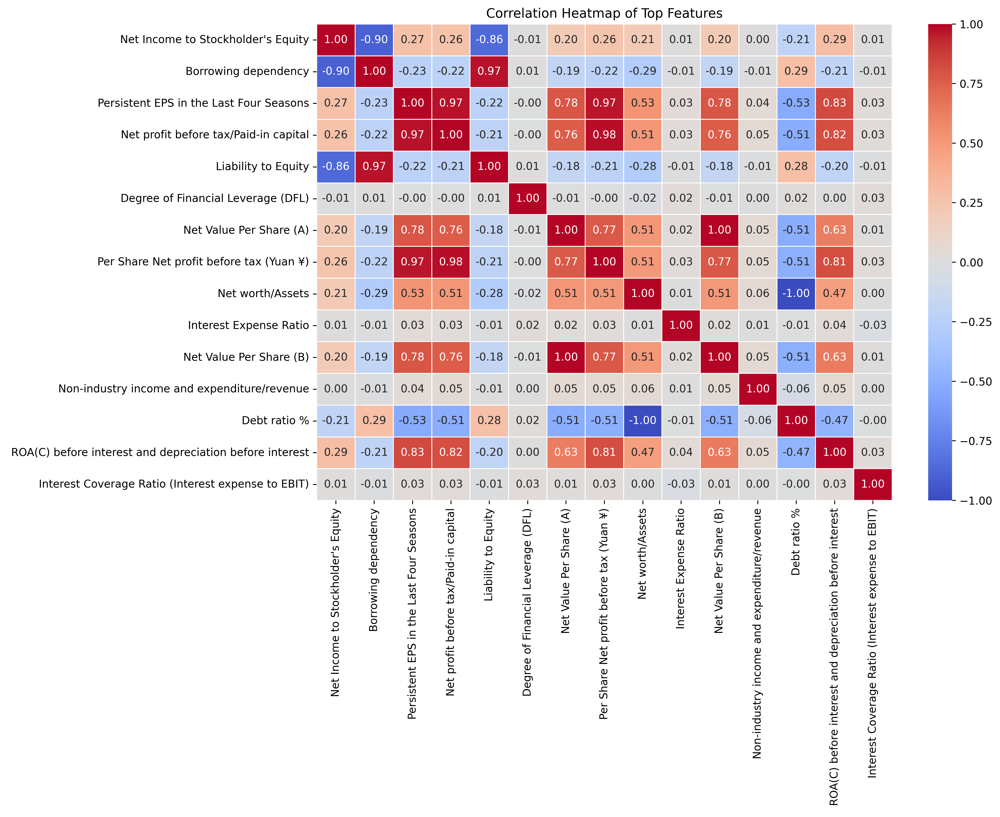

In [40]:
# Plot the heatmap of the correlation matrix
#Values close to 1 or -1 indicate high correlation between features, indicates possible multicollinearity.
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap of Top Features")
plt.show()

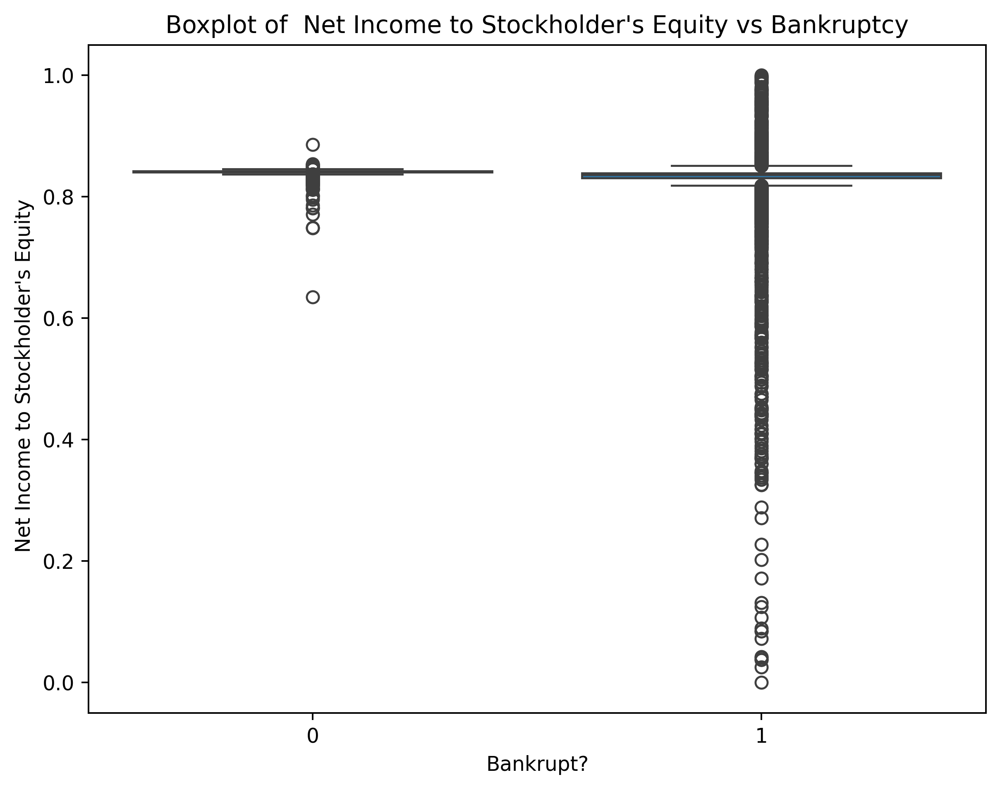

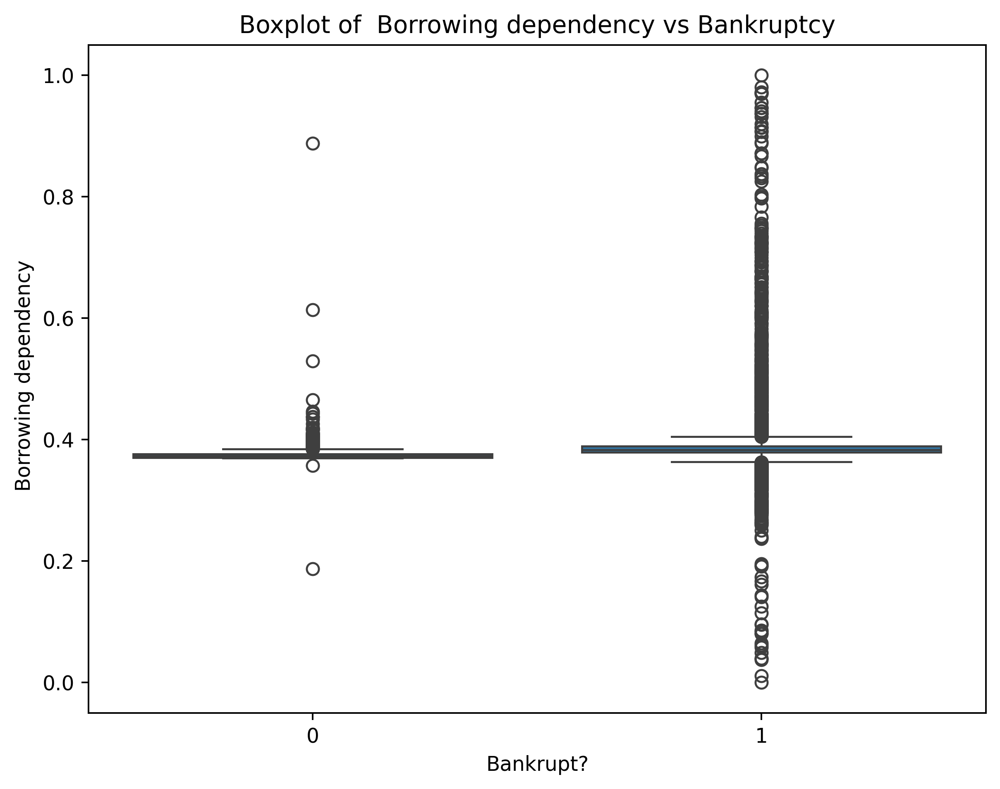

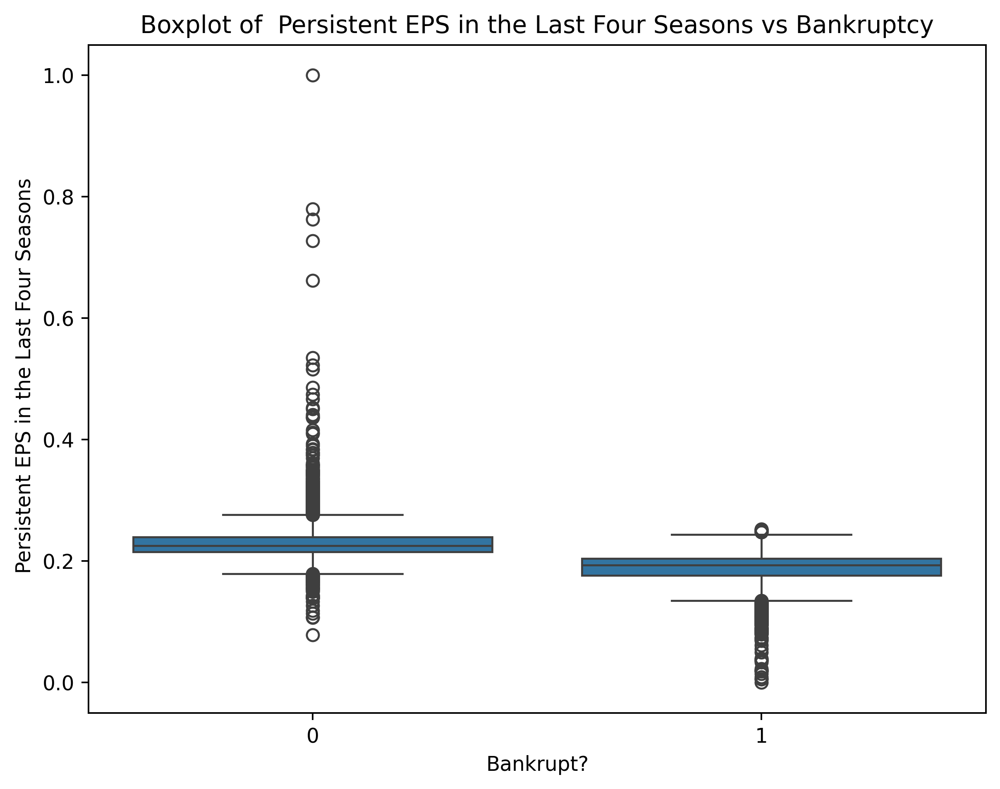

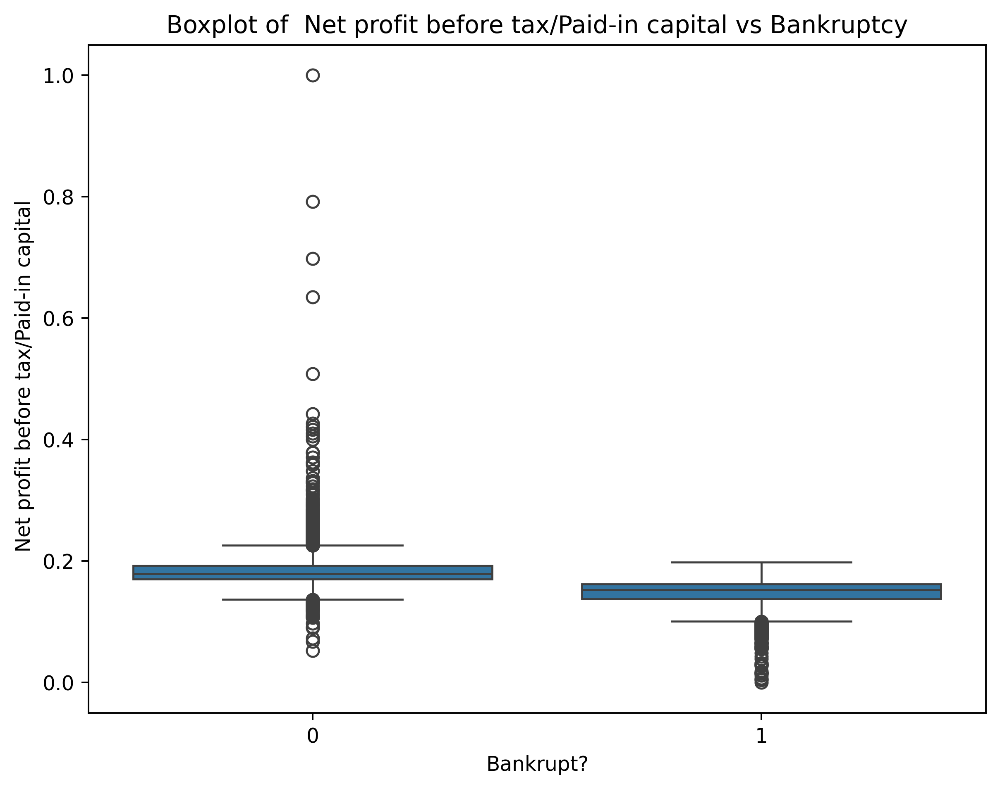

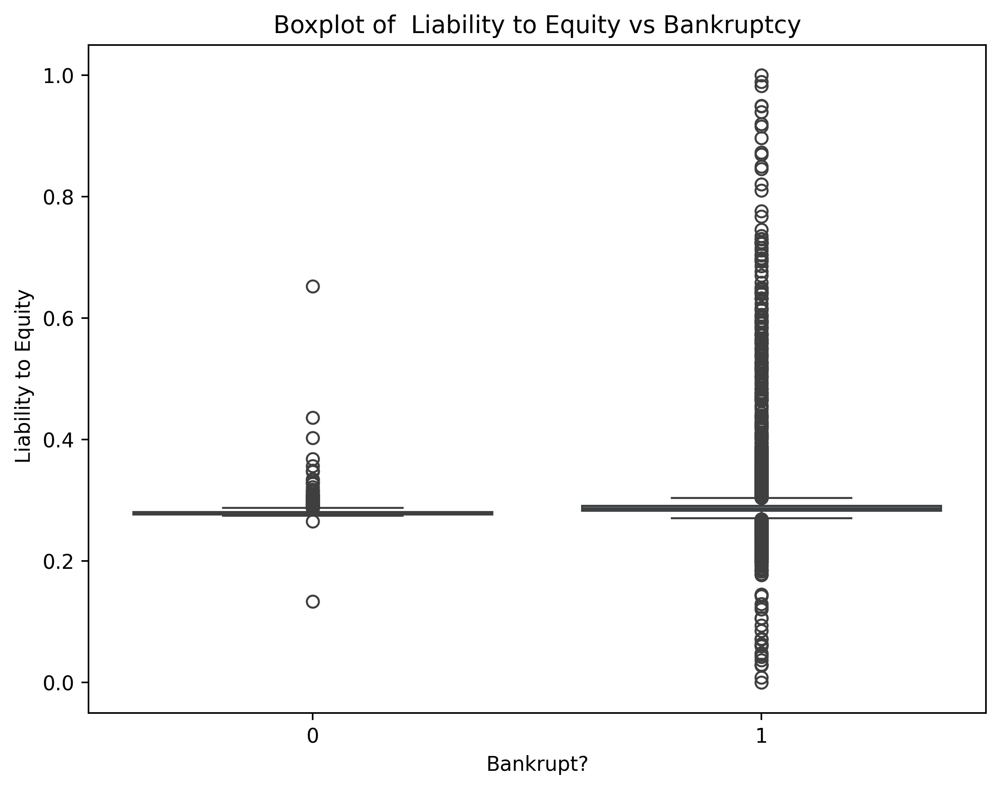

...

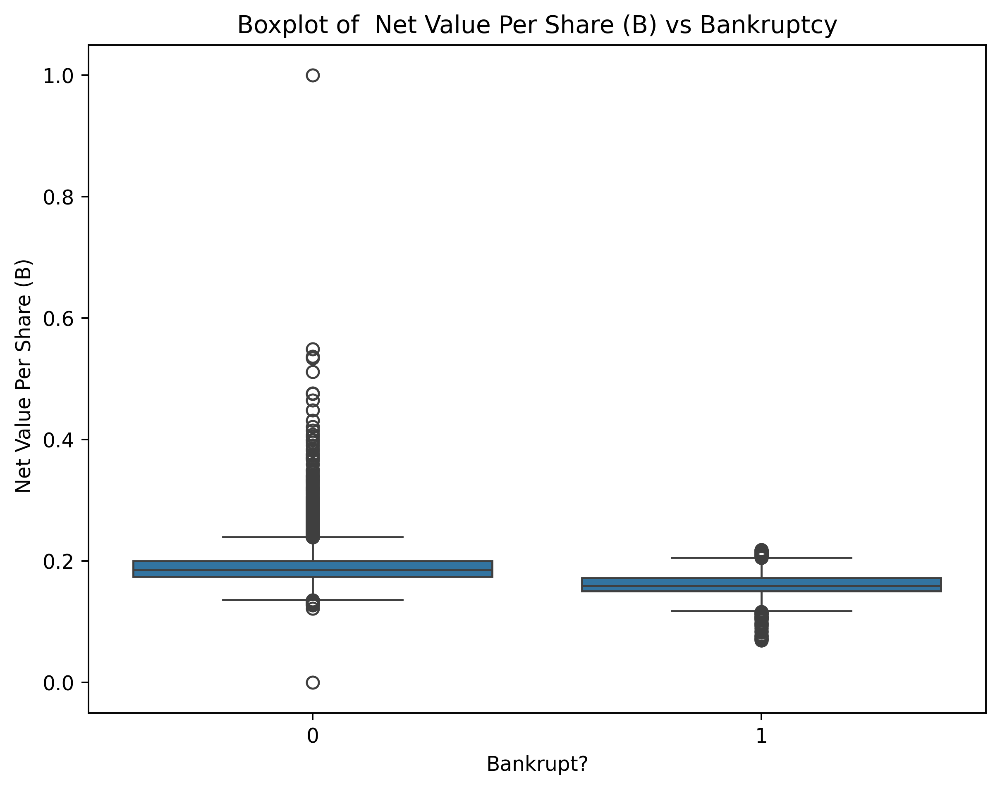

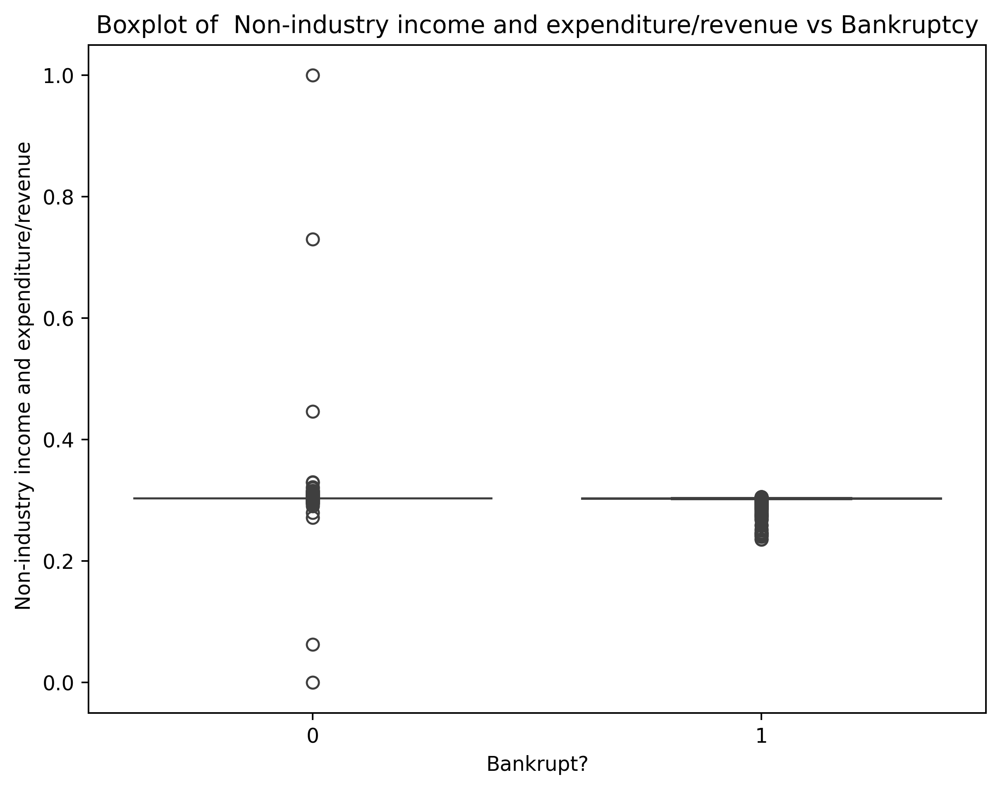

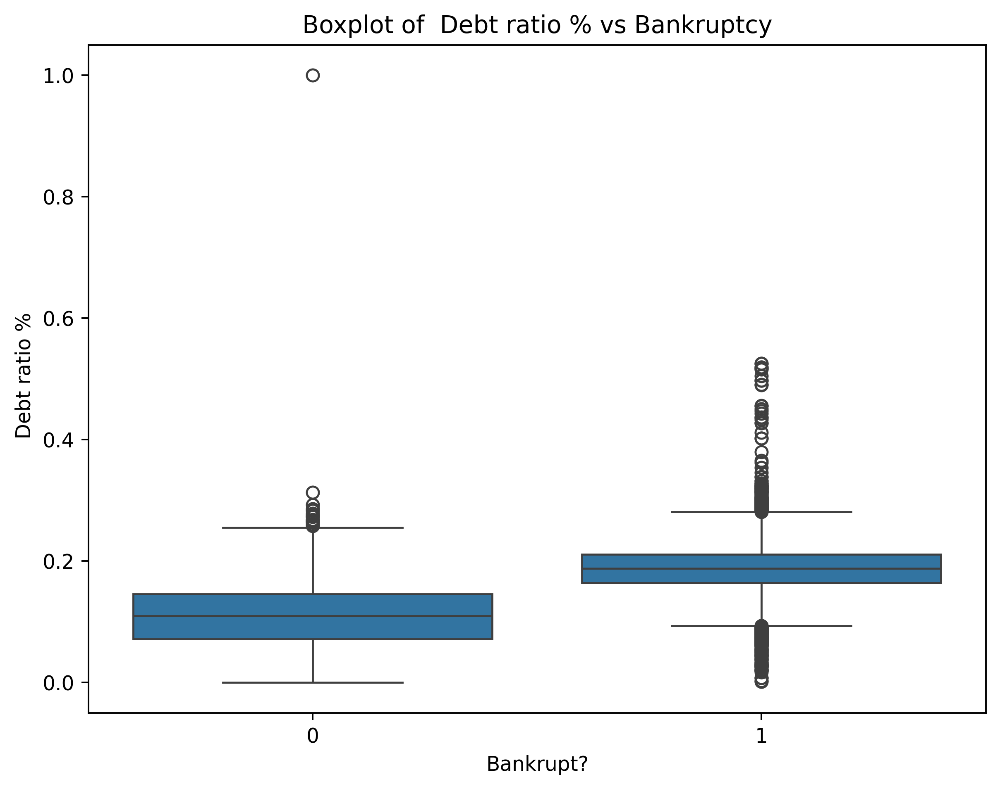

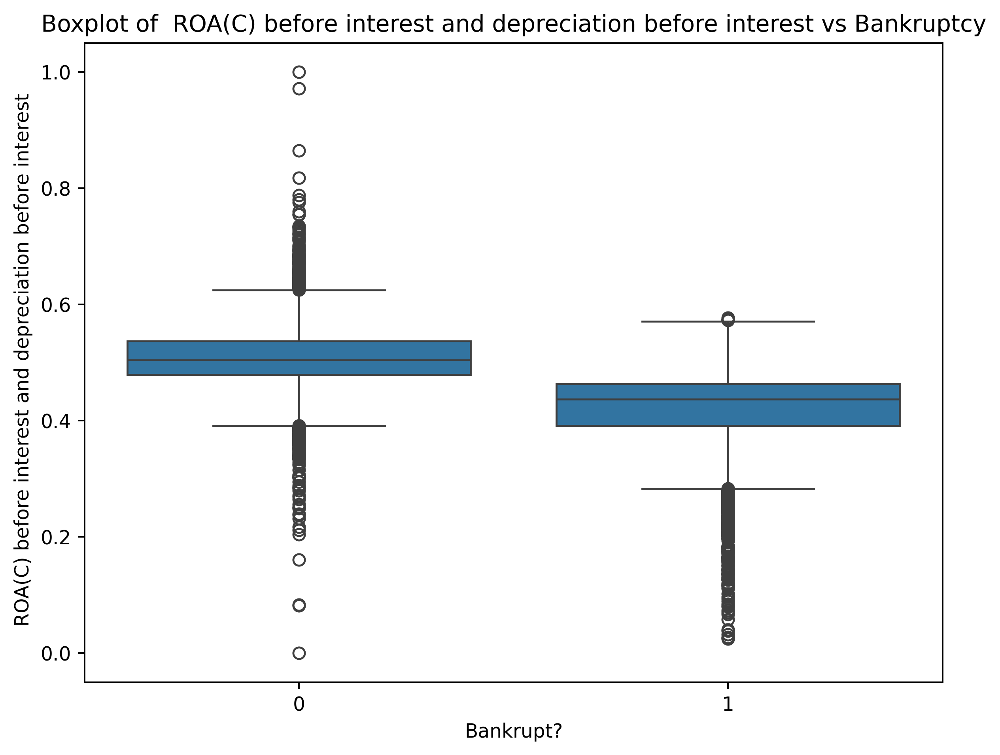

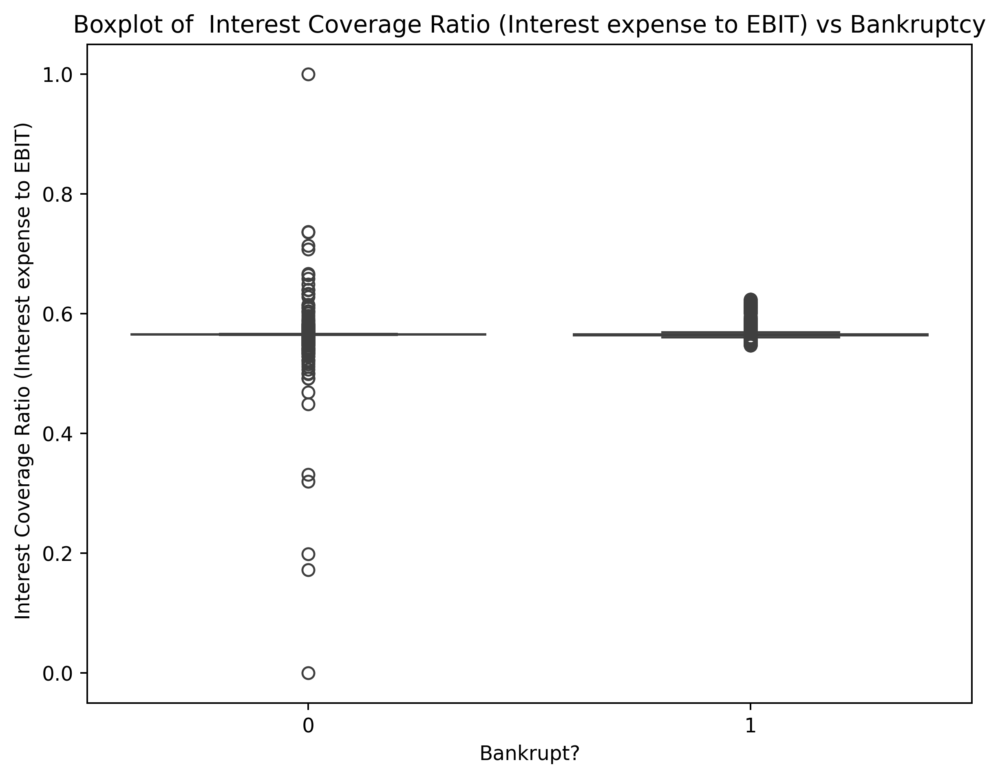

In [41]:
# Loop through important features and plot boxplots to visualize their relationship with bankruptcy
#We will get outliers which indicates the bankruptcy is not there using boxplot.
for feature in top_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Bankrupt?', y=feature, data=df1)
    plt.title(f'Boxplot of {feature} vs Bankruptcy')
    plt.show()

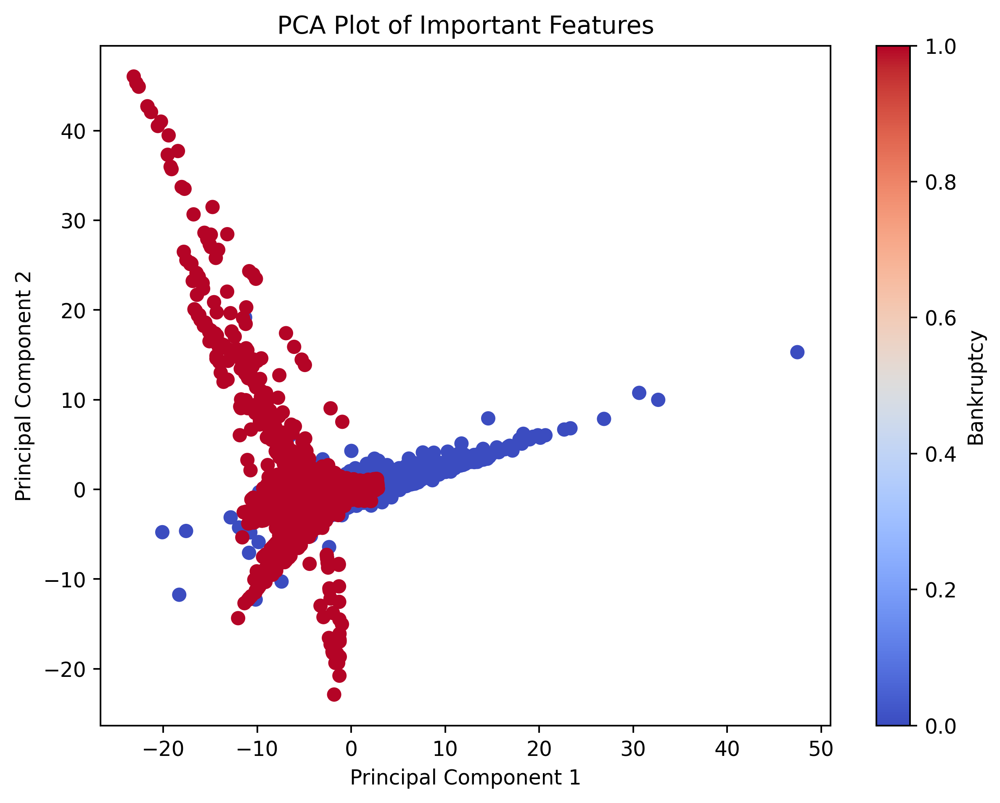

In [42]:
#PCA can reduce dimensionality by transforming the top features into a few principal components that capture the most variance.
#If the points separate well along the principal components, it suggests the features contain valuable predictive information.
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled11 = scaler.fit_transform(df1.iloc[:,:])

# Apply PCA
pca = PCA(n_components=2)  # Reduce to 2 components for visualization
pca_components = pca.fit_transform(X_scaled11)

# Plot the PCA results
plt.figure(figsize=(8, 6))
plt.scatter(pca_components[:, 0], pca_components[:, 1], c=df1['Bankrupt?'], cmap='coolwarm')
plt.title("PCA Plot of Important Features")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Bankruptcy")
plt.show()

In [43]:
#model building
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Split data into features and target
X11 = df1[top_features]
y11 = df1['Bankrupt?']

# Train-test split
X_train11, X_test11, y_train11, y_test11 = train_test_split(X11, y11, test_size=0.3, random_state=42, stratify=y11)

# Train the model
model = RandomForestClassifier(random_state=42)
model.fit(X_train11, y_train11)

# Make predictions
y_pred1 = model.predict(X_test11)

# Evaluate the model
print(classification_report(y_test11, y_pred1))

              precision    recall  f1-score   support

           0       0.98      0.95      0.96      1980
           1       0.95      0.98      0.96      1980

    accuracy                           0.96      3960
   macro avg       0.96      0.96      0.96      3960
weighted avg       0.96      0.96      0.96      3960



In [44]:
!pip install xgboost

In [45]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report

In [46]:
#using xgboost

#Initialize and train the XGBoost model
xgb_model = xgb.XGBClassifier(random_state=42, eval_metric='logloss')

# Fit the model
xgb_model.fit(X_train11, y_train11)

# Step 5: Make predictions on the test set
y_pred = xgb_model.predict(X_test11)

# Step 6: Calculate accuracy
accuracy = accuracy_score(y_test11, y_pred)
print(f"XGBoost Model Accuracy: {accuracy * 100:.2f}%")

# Step 7: Print the classification report to evaluate precision, recall, and F1-score
print(classification_report(y_test11, y_pred))


XGBoost Model Accuracy: 96.82%
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1980
           1       0.96      0.98      0.97      1980

    accuracy                           0.97      3960
   macro avg       0.97      0.97      0.97      3960
weighted avg       0.97      0.97      0.97      3960



In [47]:
accuracy*100

96.81818181818181

In [48]:
import xgboost as xgb

In [77]:
xgb_model = xgb.XGBClassifier(random_state=42, eval_metric='logloss')
xgb_model.fit(X_train11, y_train11)
y_pred = xgb_model.predict(X_test11)
print(classification_report(y_test11, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1980
           1       0.96      0.98      0.97      1980

    accuracy                           0.97      3960
   macro avg       0.97      0.97      0.97      3960
weighted avg       0.97      0.97      0.97      3960



In [49]:
#Hyper parameter tunning for XGBoost
from sklearn.model_selection import GridSearchCV

# Define a set of hyperparameters to tune
param_grid = {
    'max_depth': [3, 5,7],
    'learning_rate': [0.01, 0.1,0.2],
    'n_estimators': [100, 200,300],
    'subsample': [0.7, 0.8,0.9],
    'colsample_bytree': [0.7,0.8, 0.9]
}

# Initialize the XGBoost classifier
xgb_model = xgb.XGBClassifier(random_state=42, eval_metric='logloss')

# Set up GridSearchCV with cross-validation
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=2, scoring='accuracy', verbose=1)

# Fit the grid search to the data
grid_search.fit(X_train11, y_train11)

# Print the best parameters
print(f"Best parameters: {grid_search.best_params_}")

# Train the model with the best parameters
best_xgb_model = grid_search.best_estimator_
best_xgb_model.fit(X_train11, y_train11)

# Evaluate on the test set
y_pred = best_xgb_model.predict(X_test11)
print(classification_report(y_test11, y_pred))


Fitting 2 folds for each of 243 candidates, totalling 486 fits
Best parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1980
           1       0.96      0.98      0.97      1980

    accuracy                           0.97      3960
   macro avg       0.97      0.97      0.97      3960
weighted avg       0.97      0.97      0.97      3960



In [64]:
#Hyper parameters of xgboost are tunned using gridsearch.
#Best parameters: 
# 'colsample_bytree': 0.7 
# 'learning_rate': 0.2,
# 'max_depth': 7
# 'n_estimators': 200
# 'subsample': 0.8


In [65]:
#SHAP is used to explain the output of machine learning models by attributing each feature's contribution to the model's predictions.

In [52]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


In [66]:
#To viualize the importance features
import shap
model= best_xgb_model.fit(X_train11, y_train11)
# Initialize the explainer
explainer = shap.Explainer(model)

In [67]:
# Compute SHAP values
shap_values = explainer(X_test11)

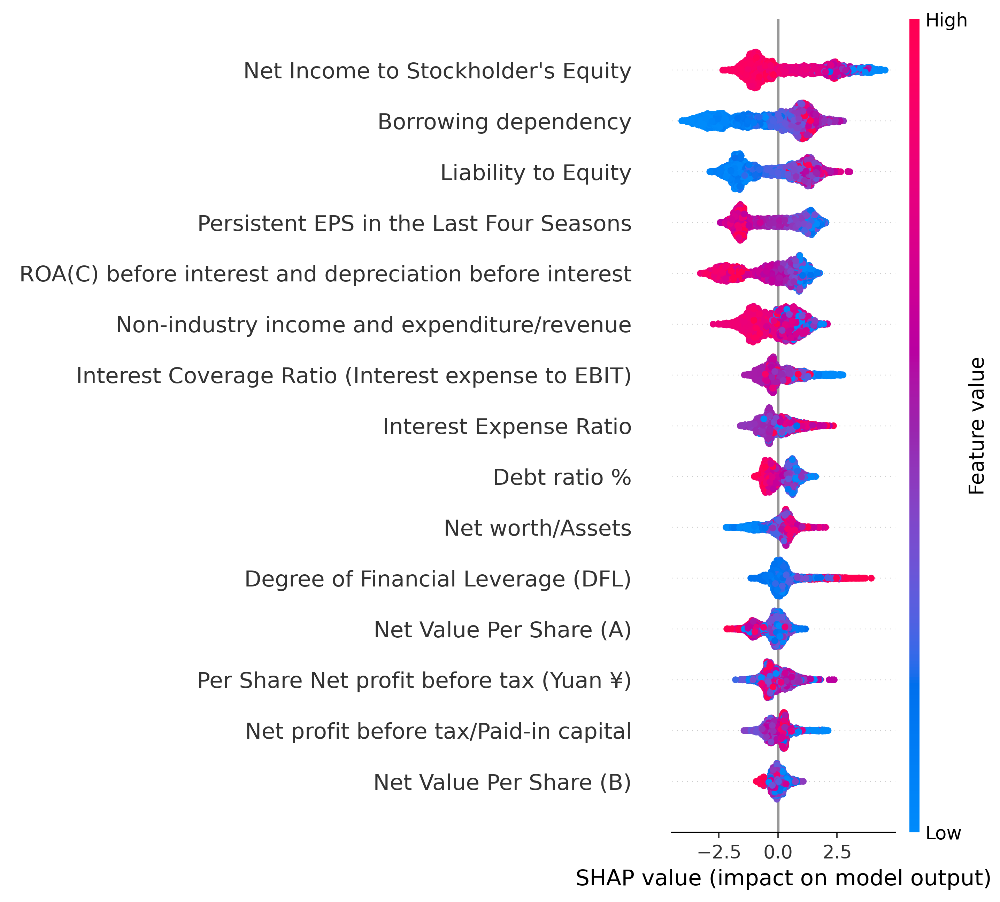

In [68]:
shap.summary_plot(shap_values, X_test11)

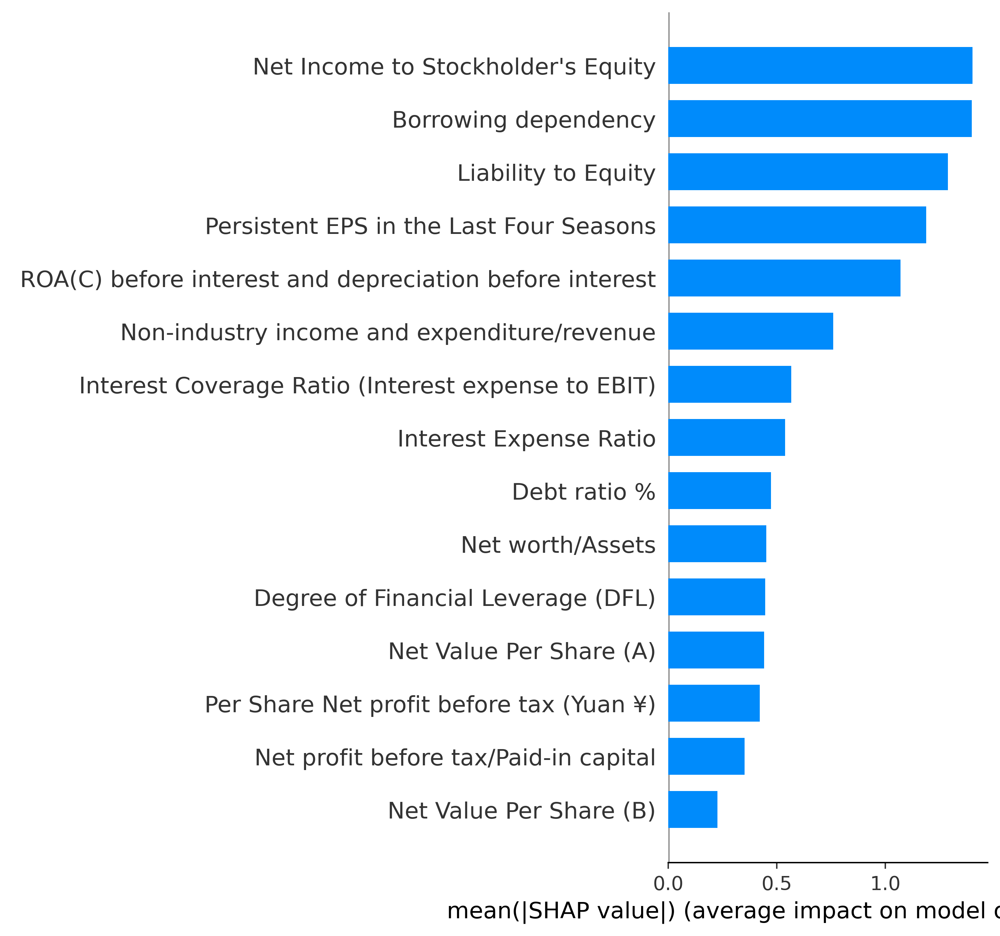

In [69]:
shap.summary_plot(shap_values, X_test11, plot_type="bar")


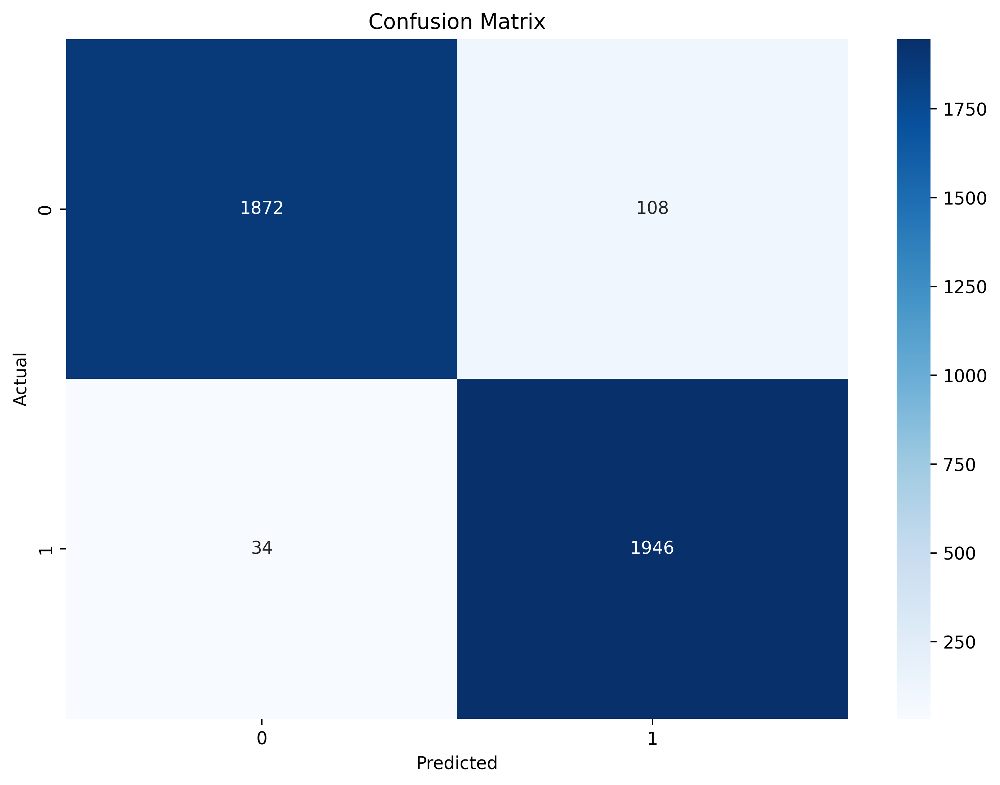

In [70]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix 
conf_matrix = confusion_matrix(y_test11, y_pred1)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [71]:
from sklearn.metrics import f1_score
f1=f1_score(y_test11,y_pred1)
f1

0.9647992067426872

In [72]:
# import joblib
# # Save the model to a file
# joblib.dump(best_xgb_clf, 'xgboost_model.pkl')

In [78]:
import pickle
pickle.dump(xgb_model,open('xgb_model.pkl','wb'))

In [79]:
load= open('xgb_model.pkl', 'rb')
model = pickle.load(load)

In [74]:
pip install streamlit

Note: you may need to restart the kernel to use updated packages.


In [75]:
df[top_features].describe()

,Net Income to Stockholder's Equity,Borrowing dependency,Persistent EPS in the Last Four Seasons,Net profit before tax/Paid-in capital,Liability to Equity,Degree of Financial Leverage (DFL),Net Value Per Share (A),Per Share Net profit before tax (Yuan ¥),Net worth/Assets,Interest Expense Ratio,Net Value Per Share (B),Non-industry income and expenditure/revenue,Debt ratio %,ROA(C) before interest and depreciation before interest,Interest Coverage Ratio (Interest expense to EBIT)
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000
mean,0.840402,0.374654,0.228813,0.182715,0.280365,0.027541,0.190633,0.184361,0.886823,0.630991,0.190661,0.303623,0.113177,0.505180,0.565358
std,0.014523,0.016286,0.033263,0.030785,0.014463,0.015668,0.033474,0.033180,0.053920,0.011238,0.033390,0.011163,0.053920,0.060686,0.013214
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.840115,0.370168,0.214711,0.169376,0.276944,0.026791,0.173613,0.170370,0.851196,0.630612,0.173613,0.303466,0.072891,0.476527,0.565158
50%,0.841179,0.372624,0.224544,0.178456,0.278778,0.026808,0.184400,0.179709,0.888593,0.630698,0.184400,0.303525,0.111407,0.502706,0.565252
75%,0.842357,0.376271,0.238820,0.191607,0.281449,0.026913,0.199570,0.193493,0.927109,0.631125,0.199570,0.303585,0.148804,0.535563,0.565725
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
import streamlit as st
import pickle
import numpy as np

# Load the model
model = pickle.load('xgboost_model.pkl')

# Define the user interface
# st.title("Bankruptcy Prediction")
# st.write("Enter the details below to predict the bankruptcy")

# Collect user input
Net_Income_to_Stockholder_Equity = st.number_input('Net Income to Stockholders Equity :', min_value=0.0, max_value=1.0, value=0.84)
Borrowing_dependency = st.number_input('Borrowing Dependency', min_value=0.0, max_value=100.0, value=0.37)
Persistent_EPS_in_the_Last_Four_Seasons = st.number_input('Persistent EPS in the Last Four Seasons:', min_value=0.0, max_value=1.0, value=0.22)
Net_profit_before_tax_Paid_in_capital = st.number_input(' Net profit before tax/Paid-in capital:', min_value=0.0, max_value=1.0, value=0.18)
Liability_to_Equity = st.number_input('Liability to Equity:', min_value=0.0, max_value=1.0, value=0.28)
Degree_of_Financial_Leverage = st.number_input('Degree of Financial Leverage (DFL):', min_value=0.0, max_value=1.0, value=0.02)
Net_Value_Per_Share = st.number_input('Net Value Per Share (A):', min_value=0.0, max_value=1.0, value=0.19)
Per_Share_Net_profit_before_tax = st.number_input('Per Share Net profit before tax (Yuan ¥):', min_value=0.0, max_value=1.0, value=0.18)
Net_worth_Assets = st.number_input('Net worth/Assets:', min_value=0.0, max_value=1.0, value=0.89)
Interest_Expense_Ratio = st.number_input('Interest Expense Ratio:', min_value=0.0, max_value=1.0, value=0.63)
Net_Value_Per_Share_B = st.number_input('Net Value Per Share (B):', min_value=0.0, max_value=1.0, value=0.19)
Non_industry_income_and_revenue = st.number_input('Non-industry income and expenditure/revenue:', min_value=0.0, max_value=1.0, value=0.3)
Debt_ratio = st.number_input('Debt ratio %:', min_value=0.0, max_value=1.0, value=0.11)
ROAC_before_interest_and_depreciation_before_interest = st.number_input('ROA(C) before interest and depreciation before interest:', min_value=0.0, max_value=1.0, value=0.50)
Interest_Coverage_Ratio = st.number_input('Interest Coverage Ratio (Interest expense to EBIT):', min_value=0.0, max_value=1.0, value=0.56)
# Make prediction when the user clicks the button
if st.button('Predict'):
    # Prepare the feature vector
    input_data = np.array([[' Net Income to Stockholder\'s Equity', ' Borrowing dependency',
                ' Persistent EPS in the Last Four Seasons', ' Net profit before tax/Paid-in capital',
                ' Liability to Equity', ' Degree of Financial Leverage (DFL)',
                ' Net Value Per Share (A)', ' Per Share Net profit before tax (Yuan ¥)',
                ' Net worth/Assets', ' Interest Expense Ratio', ' Net Value Per Share (B)',
                ' Non-industry income and expenditure/revenue', ' Debt ratio %',
                ' ROA(C) before interest and depreciation before interest',
                ' Interest Coverage Ratio (Interest expense to EBIT)']])
    
    # Predict using the model
    prediction = model.predict(input_data)[0]
    #print(prediction)
    
    # Display the prediction
    st.write(f"Predicted Bankruptcy: {prediction} ")
    if prediction==1:
        print("Bankrupt")
    else:
        print("Not Bankrupt")    


2024-10-04 11:56:25.753 
  command:

    streamlit run c:\Users\HP\anaconda3\Lib\site-packages\ipykernel_launcher.py [ARGUMENTS]


In [ ]:
 #streamlit run c:\Users\HP\anaconda3\Lib\site-packages\ipykernel_launcher.py [ARGUMENTS]


In [ ]:
pip install streamlit

Note: you may need to restart the kernel to use updated packages.
